In [1]:
import sys
!{sys.executable} -m pip install umap-learn

     |████████████████████████████████| 80 kB 12.1 MB/s eta 0:00:01
     |████████████████████████████████| 3.4 MB 59.3 MB/s eta 0:00:01
     |████████████████████████████████| 1.1 MB 67.2 MB/s eta 0:00:01
     |████████████████████████████████| 25.3 MB 74.6 MB/s eta 0:00:01
  Created wheel for umap-learn: filename=umap_learn-0.5.1-py3-none-any.whl size=76566 sha256=5770ea86157ac4546fb1f9424a849d1045ac0f080c643a9aec09a53010b4a339
  Stored in directory: /home/hadoop/.cache/pip/wheels/01/e7/bb/347dc0e510803d7116a13d592b10cc68262da56a8eec4dd72f
  Created wheel for pynndescent: filename=pynndescent-0.5.2-py3-none-any.whl size=51347 sha256=cb23baa6ff6455a44b9ed9708acbe76e3c60b20f6ff58750e64430833a0701d6
  Stored in directory: /home/hadoop/.cache/pip/wheels/62/0b/55/40d651c5a4106ea9ce68d014335a1c7bf059530722c0107b15
Successfully built umap-learn pynndescent


In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import umap
from tqdm import tqdm

In [2]:
plt.style.use('seaborn')

In [3]:
from sklearn.manifold import TSNE

In [4]:
import findspark
findspark.init()
from pyspark.sql import SparkSession
from pyspark import SparkContext

import time 
from time import sleep

sc = SparkContext()
sc

<SparkContext master=yarn appName=pyspark-shell>

In [5]:
spark = SparkSession \
 .builder \
 .appName("Python Spark SQL basic example") \
 .config("spark.some.config.option", "some-value") \
 .getOrCreate()

In [6]:
from pyspark.sql import functions as F
from pyspark.sql.types import StringType,ArrayType

In [7]:
result = spark.read.parquet('s3://hids511final/corid_embedding_pca_200_DISTINCT_5_10.parquet')

In [8]:
sample_seed_1 =  spark.read.parquet("s3://hids511final/corid_embedding_pca_200_sample_seed_01_1_DISTINCT_5_10.parquet")

In [9]:
#sample_seed_1 = result[['_c0','EMBEDDING','pca_features']].sample(.01,1)

In [10]:
result.show()

+--------+-----------+----------+----------+---------+----------+----------+-----------+----------+------------+-----------+------------+----------+----------+----------+-----------+----------+-----------+----------+-----------+-----------+-----------+-----------+-----------+----------+-----------+-----------+-----------+-----------+-----------+----------+-----------+-----------+-----------+-----------+-----------+----------+------------+------------+-----------+-----------+------------+-----------+----------+-----------+-----------+------------+-----------+------------+------------+-----------+----------+-------------+-----------+-----------+------------+-----------+------------+-----------+-----------+-----------+------------+-----------+-----------+-----------+------------+------------+-----------+----------+----------+-----------+-----------+------------+-----------+------------+-----------+----------+------------+----------+------------+-----------+-----------+-----------+--------

In [11]:
from pyspark.ml.clustering import KMeans
from pyspark.ml.evaluation import ClusteringEvaluator

In [12]:
k_range = [2,10,20,30,40,50,60,70,80,90,100,150,200]
silhouette_scores = []
for k in tqdm(k_range):
    kmeans = KMeans().setK(k).setSeed(1)
    model = kmeans.fit(result.withColumnRenamed("pca_features","features"))
    predictions = model.transform(result.withColumnRenamed("pca_features","features"))

    # Evaluate clustering by computing Silhouette score
    evaluator = ClusteringEvaluator()

    silhouette = evaluator.evaluate(predictions)
    print("Silhouette with squared euclidean distance = " + str(silhouette),k)
    silhouette_scores.append(silhouette)


    

  8%|▊         | 1/13 [00:33<06:43, 33.66s/it]

Silhouette with squared euclidean distance = 0.31067003791386977 2


 15%|█▌        | 2/13 [00:59<05:17, 28.83s/it]

Silhouette with squared euclidean distance = 0.10751754133567973 10


 23%|██▎       | 3/13 [01:29<04:53, 29.38s/it]

Silhouette with squared euclidean distance = 0.1040902270806347 20


 31%|███       | 4/13 [02:01<04:33, 30.40s/it]

Silhouette with squared euclidean distance = 0.10213219790687968 30


 38%|███▊      | 5/13 [02:36<04:19, 32.38s/it]

Silhouette with squared euclidean distance = 0.08888978907911313 40


 46%|████▌     | 6/13 [03:17<04:06, 35.26s/it]

Silhouette with squared euclidean distance = 0.08840562220925813 50


 54%|█████▍    | 7/13 [04:04<03:54, 39.01s/it]

Silhouette with squared euclidean distance = 0.08720563793940718 60


 62%|██████▏   | 8/13 [04:55<03:34, 42.83s/it]

Silhouette with squared euclidean distance = 0.08062375531855033 70


 69%|██████▉   | 9/13 [05:50<03:06, 46.63s/it]

Silhouette with squared euclidean distance = 0.0852113118795035 80


 77%|███████▋  | 10/13 [06:52<02:33, 51.20s/it]

Silhouette with squared euclidean distance = 0.07014112680276263 90


 85%|████████▍ | 11/13 [07:56<01:50, 55.40s/it]

Silhouette with squared euclidean distance = 0.07501895780375718 100


 92%|█████████▏| 12/13 [09:25<01:05, 65.41s/it]

Silhouette with squared euclidean distance = 0.06694405274658413 150


100%|██████████| 13/13 [11:16<00:00, 52.05s/it]

Silhouette with squared euclidean distance = 0.06425731955036962 200


In [13]:
print(silhouette_scores)

[0.31067003791386977, 0.10751754133567973, 0.1040902270806347, 0.10213219790687968, 0.08888978907911313, 0.08840562220925813, 0.08720563793940718, 0.08062375531855033, 0.0852113118795035, 0.07014112680276263, 0.07501895780375718, 0.06694405274658413, 0.06425731955036962]


In [14]:
pd.DataFrame([k_range,silhouette_scores]).T.rename(columns={0:'Num Clusters',1:'Silhouette score'})

,Num Clusters,Silhouette score
0,2.0,0.310670
1,10.0,0.107518
2,20.0,0.104090
3,30.0,0.102132
4,40.0,0.088890
5,50.0,0.088406
6,60.0,0.087206
7,70.0,0.080624
8,80.0,0.085211
9,90.0,0.070141


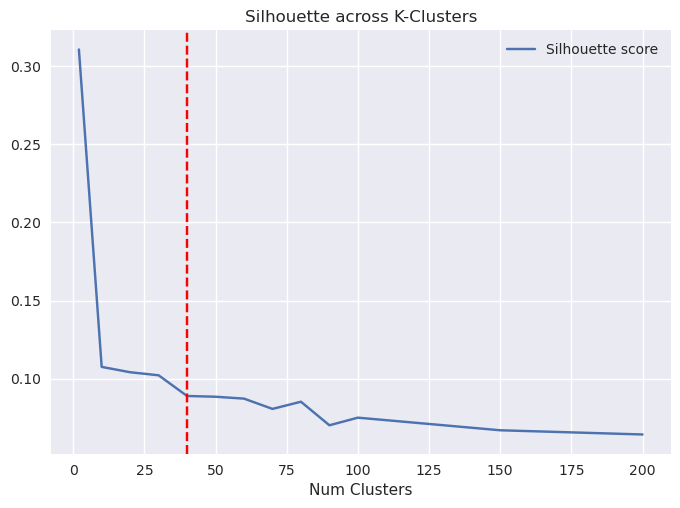

In [15]:
pd.DataFrame([k_range,silhouette_scores]).T.rename(columns={0:'Num Clusters',1:'Silhouette score'}).set_index('Num Clusters').plot.line(title='Silhouette across K-Clusters')
plt.axvline(x=40, color='red', linestyle='--')
plt.show()
plt.close()

In [16]:
kmeans = KMeans().setK(40).setSeed(1)
model = kmeans.fit(result.withColumnRenamed("pca_features","features"))
predictions = model.transform(result.withColumnRenamed("pca_features","features"))

# Evaluate clustering by computing Silhouette score
evaluator = ClusteringEvaluator()

silhouette = evaluator.evaluate(predictions)
print("Silhouette with squared euclidean distance = " + str(silhouette))
silhouette_scores.append(silhouette)


Silhouette with squared euclidean distance = 0.08888978907911314


In [17]:
trunc_pred = predictions[['_c0','EMBEDDING','prediction']].withColumnRenamed("_c0","_c0_pred")

In [18]:
trunc_pred.show()

+--------+--------------------+----------+
|_c0_pred|           EMBEDDING|prediction|
+--------+--------------------+----------+
|8jszy62z|[1.81392896175384...|        33|
|m03w7f5j|[-0.3659326434135...|        18|
|wj5vhvxx|[-1.5713391304016...|        22|
|h0gs2pz7|[-0.2809154093265...|        32|
|566ll8oi|[1.57514643669128...|        38|
|mdmqcvww|[-1.8470623493194...|        23|
|975u2k0s|[-3.7059042453765...|         2|
|l8a7lzhb|[-6.7001314163208...|        29|
|421vcmz1|[-4.2648954391479...|        10|
|rcx450b6|[-1.6233532428741...|        37|
|g754gjvh|[-0.4169462025165...|        15|
|t489ut8z|[-2.4220397472381...|        31|
|pi7lekcp|[0.56459283828735...|        38|
|nznqdtq1|[-2.6714475154876...|         8|
|hk0hu2yo|[-4.0184741020202...|         8|
|sf7c34lj|[-1.3721044063568...|        29|
|1oeeqaep|[2.34631443023681...|        14|
|u7zxjwkg|[-1.5488121509552...|        31|
|qvny4ci3|[-0.0755093097686...|        26|
|x2mtxmus|[-2.1194081306457...|        37|
+--------+-

In [19]:
sample_seed_1_cluser_assinged = sample_seed_1.join(trunc_pred[['_c0_pred','prediction']],
                                                   sample_seed_1["_c0"] == trunc_pred["_c0_pred"],"left")

In [20]:
sample_seed_1_cluser_assinged.show()

+--------+--------------------+--------------------+--------+----------+
|     _c0|           EMBEDDING|        pca_features|_c0_pred|prediction|
+--------+--------------------+--------------------+--------+----------+
|00a19z5i|[-4.0260972976684...|[50.1645298208696...|00a19z5i|        37|
|03er0xjy|[2.24352216720581...|[30.0484083110016...|03er0xjy|        14|
|04uf62g7|[-3.8663520812988...|[40.6927201762211...|04uf62g7|         2|
|06ol4igi|[1.53384220600128...|[26.3340807172713...|06ol4igi|        26|
|08k3r476|[-3.7902088165283...|[28.3916017481520...|08k3r476|         8|
|08lwff2x|[-2.4967875480651...|[29.3963851471754...|08lwff2x|        34|
|09epwbta|[-1.4549742937088...|[-8.5280056591159...|09epwbta|        32|
|0bpse3a0|[1.73539829254150...|[11.7279207596334...|0bpse3a0|        14|
|0jjlrp0l|[2.92487478256225...|[-13.342124538388...|0jjlrp0l|         1|
|0vybc2gq|[0.37723752856254...|[-33.476009799680...|0vybc2gq|        12|
|13sr3wey|[-4.7930393218994...|[33.0979729283422...

In [21]:
df = pd.DataFrame(sample_seed_1_cluser_assinged[['_c0','EMBEDDING','prediction']].collect())

In [22]:
X = [np.array(i) for i in df[1].values]

In [23]:
X = np.array(X)

In [24]:
X_embedded = TSNE(n_components=2).fit_transform(X)

In [25]:
X_embedded.shape

(53152, 2)

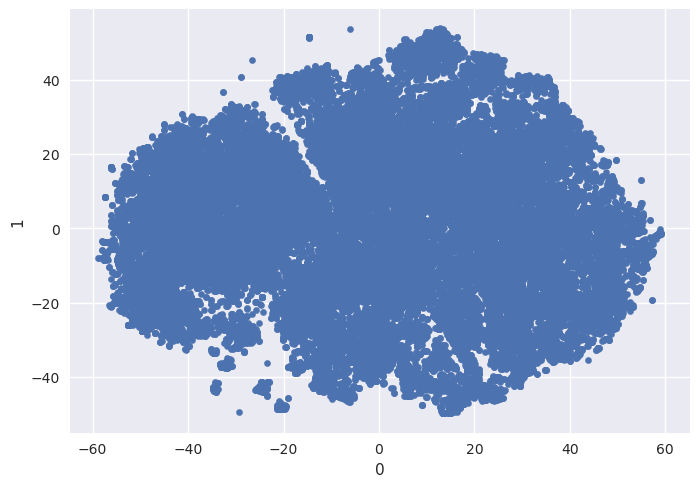

In [26]:
pd.DataFrame(X_embedded).plot.scatter(x=0,y=1)
plt.show()
plt.close()

In [27]:
TSNE_2d = pd.DataFrame(X_embedded)

In [28]:
TSNE_2d['cluster']= df[2].values

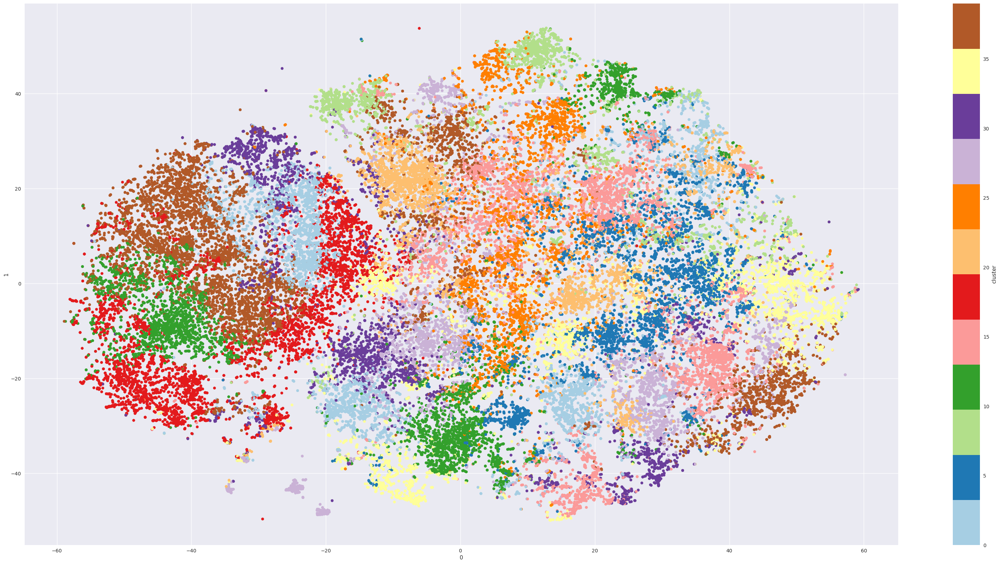

In [29]:
c_map_opt = ['Pastel1', 'Pastel2', 'Paired', 'Accent',
                        'Dark2', 'Set1', 'Set2', 'Set3',
                        'tab10', 'tab20', 'tab20b', 'tab20c']

#for cmap in c_map_opt:

pd.DataFrame(TSNE_2d).plot.scatter(x=0,y=1,c='cluster', cmap='Paired', s=30,figsize=(40,20))
plt.show()
plt.close()

In [30]:
TSNE_2d.values

array([[ 45.77265549, -24.92974854,  37.        ],
       [ 18.02015495, -45.61761856,  14.        ],
       [ 28.74037361,  30.12084198,   2.        ],
       ...,
       [-46.45283127,  17.73502159,  38.        ],
       [  8.09065247, -29.62614822,   4.        ],
       [-12.52987957, -11.52127743,  30.        ]])

In [31]:
TSNE_2d.groupby('cluster').first().reset_index()

,cluster,0,1
0,0,-14.648376,-31.026533
1,1,-23.729187,11.397648
2,2,28.740374,30.120842
3,3,15.179981,-21.636484
4,4,7.799817,-29.020868
5,5,25.690012,-14.036771
6,6,25.202452,14.379672
7,7,10.651171,48.181629
8,8,27.578697,-3.048548
9,9,-17.657520,38.455456


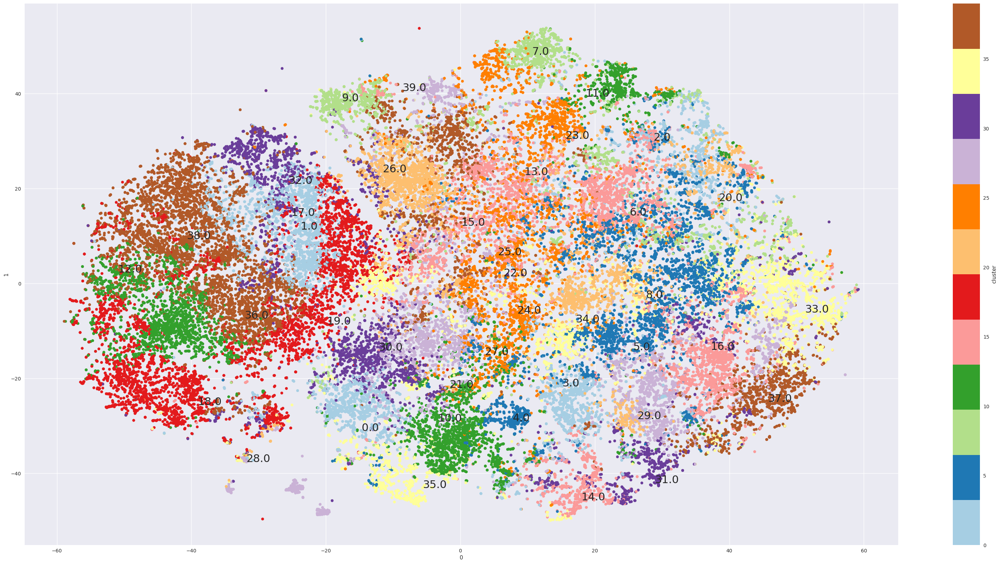

In [32]:

#for cmap in c_map_opt:

ax = TSNE_2d.plot.scatter(x=0,y=1,c='cluster', cmap='Paired', s=30,figsize=(40,20))


for i, txt in enumerate(TSNE_2d.groupby('cluster').first().reset_index().values):
    ax.annotate(txt[0], (txt[1], txt[2]),fontsize=22)
    
plt.show()
plt.close()

In [87]:
sample_seed_1_cluser_assinged.show()

+--------+--------------------+--------------------+--------+----------+
|     _c0|           EMBEDDING|        pca_features|_c0_pred|prediction|
+--------+--------------------+--------------------+--------+----------+
|1qswwxw8|[-5.6927232742309...|[15.6444404052320...|1qswwxw8|        15|
|5vvl0npo|[-2.3355121612548...|[47.8782494955001...|5vvl0npo|        28|
|5wraup2d|[1.34078013896942...|[-0.0133305518779...|5wraup2d|        32|
|5wraup2d|[1.34078013896942...|[-0.0133305518779...|5wraup2d|        32|
|76fftal3|[-3.1268446445465...|[41.1048164608631...|76fftal3|        27|
|7zo4o617|[-1.1468764543533...|[39.6879685406620...|7zo4o617|        40|
|85lg00a8|[1.17229330539703...|[-15.468575662867...|85lg00a8|         6|
|86w7qwbz|[0.36785805225372...|[-29.887670905835...|86w7qwbz|         1|
|86w7qwbz|[0.36785805225372...|[-29.887670905835...|86w7qwbz|         1|
|9fp80ujt|[2.01924157142639...|[-25.687166430257...|9fp80ujt|        10|
|9fp80ujt|[2.01924157142639...|[-25.687166430257...

In [88]:
sample_seed_1_cluser_assinged.write.parquet("s3://hids511final/corid_embedding_pca_200_sample_seed_01_1_KMEANS_PRED_doublechecksample.parquet")

In [34]:
sample_seed_20_percent = result[['_c0','EMBEDDING','pca_features']].sample(.2,1)

sample_seed_20_percent_cluster_assigned = sample_seed_20_percent.join(trunc_pred[['_c0_pred','prediction']],
                                                   sample_seed_20_percent["_c0"] == trunc_pred["_c0_pred"],"left")


In [35]:
df = pd.DataFrame(sample_seed_20_percent_cluster_assigned[['_c0','EMBEDDING','prediction']].collect())

X = [np.array(i) for i in df[1].values]

X = np.array(X)

X.shape

(106390, 768)

In [36]:
X_embedded = TSNE(n_components=2).fit_transform(X)

In [37]:
X_embedded.shape

(106390, 2)

In [38]:
TSNE_2d = pd.DataFrame(X_embedded)

In [39]:
TSNE_2d['cluster']= df[2].values

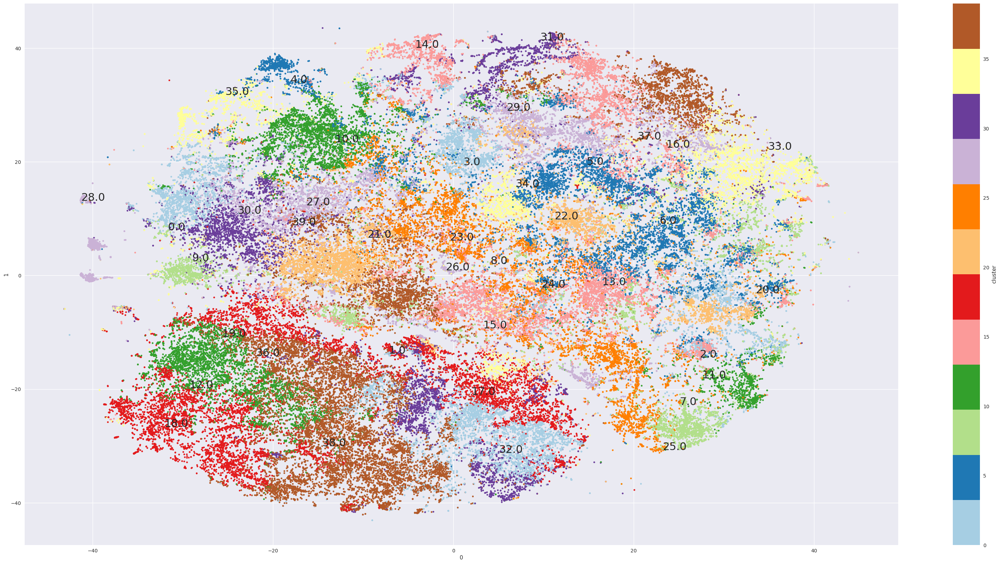

In [42]:

#for cmap in c_map_opt:

ax = TSNE_2d.plot.scatter(x=0,y=1,c='cluster', cmap='Paired', s=10,figsize=(40,20))


for i, txt in enumerate(TSNE_2d.groupby('cluster').first().reset_index().values):
    ax.annotate(txt[0], (txt[1], txt[2]),fontsize=22)
    
plt.show()
plt.close()

In [43]:
sample_seed_20_percent_cluster_assigned.write.parquet("s3://hids511final/corid_embedding_pca_200_sample_seed_02_1_KMEANS_PRED_DISTINCT.parquet")

In [50]:
from pyspark.sql.functions import lit

In [60]:
TSNE_2d['_c0_TSNE'] = df[0].values

In [ ]:
TSNE_DF_spark = spark.createDataFrame(TSNE_2d)

In [56]:
sample_seed_20_percent_cluster_assigned.show()

+--------+--------------------+--------------------+--------+----------+
|     _c0|           EMBEDDING|        pca_features|_c0_pred|prediction|
+--------+--------------------+--------------------+--------+----------+
|03er0xjy|[2.24352216720581...|[30.0484083110016...|03er0xjy|        14|
|07ihsjpj|[-0.5070083737373...|[39.1026785418142...|07ihsjpj|        31|
|09epwbta|[-1.4549742937088...|[-8.5280056591159...|09epwbta|        32|
|0bogmafi|[-0.2539308369159...|[-13.640118312958...|0bogmafi|         1|
|0fcmytxx|[-3.5011496543884...|[4.56722789263117...|0fcmytxx|        32|
|0gzdq6lv|[-2.4559533596038...|[19.6769324054203...|0gzdq6lv|        39|
|0jjlrp0l|[2.92487478256225...|[-13.342124538388...|0jjlrp0l|         1|
|0juibodd|[-4.7090401649475...|[44.4634722245052...|0juibodd|        13|
|0ku9vcgb|[-2.0946946144104...|[45.0794530623306...|0ku9vcgb|        13|
|0n2dd7u6|[-2.9160163402557...|[46.8594765215377...|0n2dd7u6|        33|
|0plznmwi|[-3.2184903621673...|[44.1659359685136...

In [42]:
sc.stop()

In [43]:
spark.stop()